# Libraries, functions and settings

In [1]:
# Utilities
import geopandas as gpd
import pandas as pd
import numpy as np

# Save and load data
import os
import pickle

# Machine Learning and analysis
from operator import itemgetter
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error as mse

# Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(context = 'notebook', style = "darkgrid", color_codes=False)
from sklearn.tree import export_graphviz 
from io import StringIO
from IPython.display import Image  
from pydotplus import graph_from_dot_data

# My own functions
from f import *

## Settings

In [2]:
# Choose whether to save or not the plots
save_plot = True

# Choose the data to use
## Year
year = '2018'
## Resolution of data hexagones
res = '09'
## Land cover
lc_id = '13'
lc = 'Urban&BuildUpLands'

# Train-Test percentage
train_size = 0.9
test_size = 0.1

## Directories 

In [3]:
# Data directories
data_dir = f'Ecosphere/ISEA3H{res}'
centroids_dir = 'Spatial'
processed_data_dir = f'Output/{lc_id}. {lc}/Processed data/TTS{int(train_size*100)}{int(test_size*100)}'
plot_dir = f'Output/{lc_id}. {lc}/Plots/TTS{int(train_size*100)}{int(test_size*100)}'
train_test_data_dir = f'Output/{lc_id}. {lc}/Train and Test sets'

In [4]:
# Create directories
os.makedirs(processed_data_dir, exist_ok = True)
os.makedirs(plot_dir, exist_ok = True)
os.makedirs(train_test_data_dir, exist_ok = True)

# Data

In [5]:
# Import the data of all and only the hexagons such that:
# - at least one bioclimatic variable is available
# - they ar not only composed of water bodies

data = ImportLandData(year, res, data_dir, centroids_dir, stats=False)
data.head()

,HID,geometry,IGBP_01_Fraction,IGBP_02_Fraction,IGBP_03_Fraction,IGBP_04_Fraction,IGBP_05_Fraction,IGBP_06_Fraction,IGBP_07_Fraction,IGBP_08_Fraction,...,BIO10_Centroid,BIO11_Centroid,BIO12_Centroid,BIO13_Centroid,BIO14_Centroid,BIO15_Centroid,BIO16_Centroid,BIO17_Centroid,BIO18_Centroid,BIO19_Centroid
55,56,POINT (11.25000 79.18998),0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.900000,-14.300000,417.0,49.0,18.0,28.678305,130.0,64.0,85.0,119.0
74,75,POINT (11.25000 64.32417),0.152131,0.0,0.0,0.000083,0.023048,0.000000,0.036395,0.374067,...,13.450000,-1.933333,1314.0,150.0,62.0,28.921973,425.0,215.0,258.0,402.0
75,76,POINT (11.25000 63.56055),0.179920,0.0,0.0,0.000828,0.043075,0.000000,0.144881,0.153827,...,12.766667,-3.883333,1221.0,138.0,70.0,21.339184,379.0,222.0,320.0,317.0
76,77,POINT (11.25000 62.79923),0.039768,0.0,0.0,0.000414,0.011350,0.000083,0.491301,0.035294,...,9.883333,-7.500000,779.0,96.0,43.0,25.895052,264.0,138.0,257.0,172.0
77,78,POINT (11.25000 62.04027),0.051254,0.0,0.0,0.000083,0.001159,0.000000,0.043388,0.070299,...,9.683333,-9.533333,697.0,92.0,32.0,35.856390,257.0,103.0,257.0,119.0


## Data preparation for Machine Learning

In [6]:
# Features = Bioclimate Variables.
X = data[bv_cols].copy()
# Target = Land Cover
y = data[f'IGBP_{lc_id}_Fraction']

In [7]:
# Traditional Train-Test set creation

## Directory to store the train test split
file_dir = os.path.join(train_test_data_dir,
                        f'TrainTestSplit_{int(train_size*100)}{int(test_size*100)}.pickle')

if os.path.exists(file_dir):
    with open(file_dir, 'rb') as file: 
        [X_train, X_test, y_train, y_test] = pickle.load(file)
    print('Train-Test split loaded.')
else:
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = train_size,
                                                        random_state = 1, shuffle = True)
    with open(file_dir, 'wb') as file:
        pickle.dump([X_train, X_test, y_train, y_test], file)
    print('Train-Test split created.')

Train-Test split created.


# Regression trees

Let us use some regression tree to model the land cover selected, according to the bioclimatic variables available. 

Firstly, let us check which is the maximum depth a full regression tree can reach.

In [8]:
# Full regression tree (default settings)
DTR = DecisionTreeRegressor()
DTR.fit(X_train, y_train)
md = DTR.tree_.max_depth
print(f"Maximum depth of a full regression tree: {md}")

Maximum depth of a full regression tree: 45


## Pre-pruning 1: control the maximum depth of the tree

Let us check how the MSE on the train and test set, and estimated by CV, varies as the maximum depth of the tree grows.

In [9]:
test_MSE = []
train_MSE = []

for d in range(1, md+1):
    # Regression tree with max_depth = d
    DTR = DecisionTreeRegressor(max_depth=d)
    DTR.fit(X_train, y_train)
    # MSE on the train data
    y_pred = DTR.predict(X_test)
    test_MSE.append(mse(y_pred, y_test))
    # MSE on the test data
    y_pred = DTR.predict(X_train)
    train_MSE.append(mse(y_pred, y_train))

In [10]:
# Grid Search and k-fold CV 
CV = GridSearchCV(estimator = DecisionTreeRegressor(),
                  param_grid = {'max_depth' : list(range(1, md+1))},
                  scoring = 'neg_mean_squared_error',
                  cv = 5,
                  return_train_score = True)

CV.fit(X_train, y_train)

# MSE on unknown instances estimate via CV
cv_MSE = CV.cv_results_['mean_test_score']*-1

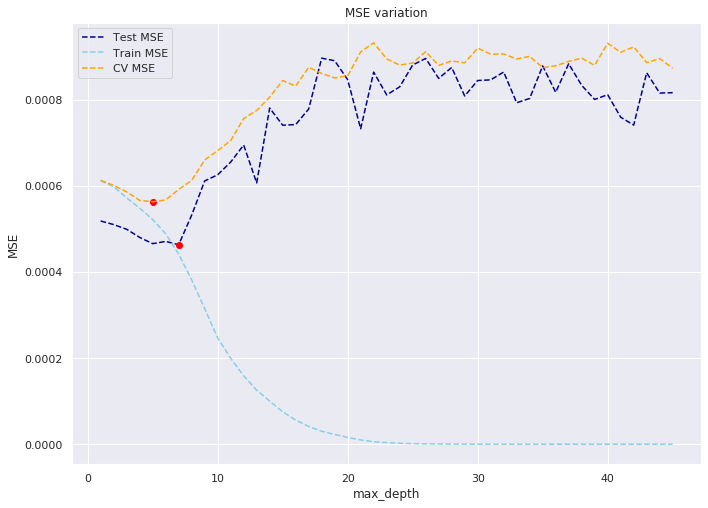

The minimum MSE on the test set is 0.000463 and it is reached at max_depth = 7.
The minimum CV MSE is 0.000563 and it is reached at max_depth = 5.


In [40]:
fig, ax = plt.subplots(figsize = (10,7))

x = list(range(1, md+1))
# Test MSE
ax.plot(x, test_MSE, linestyle = '--', color = 'darkblue', label = 'Test MSE', zorder = 1)
ax.scatter(min(x)+np.argmin(test_MSE), np.min(test_MSE), color = 'red', zorder = 2)

# Train MSE
ax.plot(x, train_MSE, linestyle = '--', color = 'skyblue', label = 'Train MSE')
# CV MSE
ax.plot(x, cv_MSE, linestyle = '--', color = 'orange', label = 'CV MSE')
ax.scatter(min(x)+np.argmin(cv_MSE), np.min(cv_MSE), color = 'red', zorder = 2)

ax.set(xlabel = 'max_depth', ylabel = 'MSE')
ax.legend()
plt.tight_layout()

if save_plot: plt.savefig(os.path.join(plot_dir,f'IGBP{lc_id}_DTR_MSEvsMaxDepth.jpg'),
                          optimize = True, box_inches = 'tight', dpi = 200)
    
ax.set_title('MSE variation')
plt.show()

print(f"The minimum MSE on the test set is {np.min(test_MSE):.3} "
      f"and it is reached at max_depth = {1+np.argmin(test_MSE)}.\n"
      f"The minimum CV MSE is {np.min(cv_MSE):.3} "
      f"and it is reached at max_depth = {1+np.argmin(cv_MSE)}.")

## Search of parameters

### Choice of effective $\alpha$ for cost-complexity pruning

First we need to identify some possible effective values of the tuning parameter $\alpha$ to perform **cost-complexity pruning**.

In [12]:
DTR = DecisionTreeRegressor()
path = DTR.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
print(f"There are {len(ccp_alphas)} possible tuning parameters.")

There are 17766 possible tuning parameters.


Since the number of possible tuning parameters is too large, we look for the smallest among all that limit the total impurity of the leaves to some fixed values. We include $\alpha=0$ to consider the case without cost-complexity pruning.

In [19]:
ccp_alpha = [] 
for t in [0.0001, 0.0002]: 
    alpha = max([(i,a) for i,a in enumerate(ccp_alphas) if impurities[i] <= t],
                key=itemgetter(1))
    ccp_alpha.append(alpha)

# Index, alpha chosen
idx, ccp_alpha = zip(*ccp_alpha)
## In order to avoid a lot of variability from multiple executions,
## I prefer to round decimal digits
ccp_alpha = [0]+[round(a,8) for a in ccp_alpha] # 0 = no ccp.
print(f"The values chosen for the tuning parameter are: {ccp_alpha[1]} and {ccp_alpha[2]}.")

The values chosen for the tuning parameter are: 2.1e-07 and 6e-07.


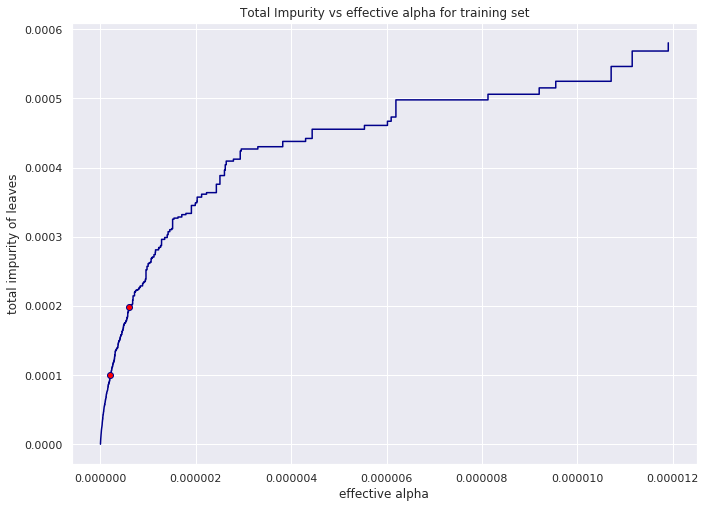

The red markers are the points corresponding to the alpha chosen.


In [20]:
fig, ax = plt.subplots(figsize = (10,7))

ax.plot(ccp_alphas[:-1], impurities[:-1],
        marker = 'o', markevery = list(idx) , mfc = 'red', 
        drawstyle = "steps-post", color = 'darkblue')
# Removed the last alpha since it is the one that reduce the tree to a single node.
ax.set(xlabel = "effective alpha", ylabel = "total impurity of leaves")
plt.tight_layout()

if save_plot: plt.savefig(os.path.join(plot_dir,f'IGBP{lc_id}_DTR_ImpurityVsCcpAlpha.jpg'),
                          optimize = True, box_inches = 'tight', dpi = 200)
    
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

print("The red markers are the points corresponding to the alpha chosen.")

### Grid search and pruning

Making use of grid search and $k$-fold CV, we can see how the estimate of the prediction MSE, varies, while performing some:
 - *pre-pruning*, operating on parameters `max_dept` and `min_samples_split`;
 - *post-pruning*, operating on parameter `ccp_alpha`.

Furthermore, we will look at whether a greedy (`splitter = best`) or random (`splitter = random`) splitting approach is more effective.

In [41]:
# Range of max_dept
d_min, d_max = 2, 22

# Hyperparameters for the Grid Search
hyperparams = {'splitter': ['best', 'random'],
               'max_depth': list(range(d_min, d_max)), 
               'min_samples_split': [2, 5, 10, 15],
               'ccp_alpha': ccp_alpha}

# Directory to store the Grid Search results
file_dir = os.path.join(processed_data_dir,'DTR_GS.pickle')

if os.path.exists(file_dir):
    with open(file_dir, 'rb') as file: DTR_GS = pickle.load(file)
    print('Grid Search loaded')
else:
    # Grid Search and k-fold CV
    DTR_GS = GridSearchCV(estimator = DecisionTreeRegressor(criterion = 'mse'),
                          param_grid = hyperparams,
                          scoring = 'neg_mean_squared_error',
                          cv = 5,
                          return_train_score = True,
                          n_jobs = 4,
                          verbose = 3)
    
    DTR_GS.fit(X_train, y_train)

    with open(file_dir, 'wb') as file: pickle.dump(DTR_GS, file)
    print('Grid Search executed')

# Grid Search results
DTR_GS_results = pd.DataFrame(DTR_GS.cv_results_)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.0s
[Parallel(n_jobs=4)]: Done 329 tasks      | elapsed:   17.2s
[Parallel(n_jobs=4)]: Done 492 tasks      | elapsed:   36.7s
[Parallel(n_jobs=4)]: Done 716 tasks      | elapsed:  1.2min
[Parallel(n_jobs=4)]: Done 1172 tasks      | elapsed:  1.8min
[Parallel(n_jobs=4)]: Done 1536 tasks      | elapsed:  2.8min
[Parallel(n_jobs=4)]: Done 2080 tasks      | elapsed:  3.7min


Grid Search executed


[Parallel(n_jobs=4)]: Done 2400 out of 2400 | elapsed:  4.7min finished


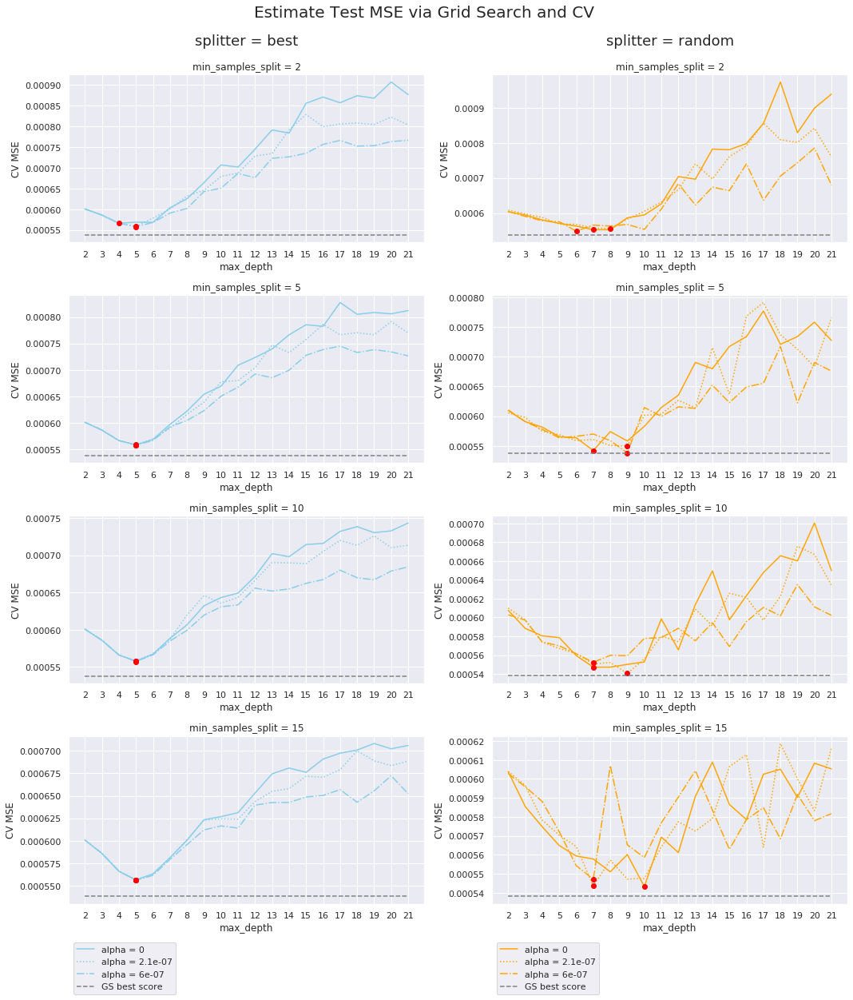

In [42]:
fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (15,17))

ls = ['-', ':', '-.']
col = ['skyblue', 'orange']

R = DTR_GS_results
for j, splitter in enumerate(hyperparams['splitter']):
    for i, mss in enumerate(hyperparams['min_samples_split']):
        for k, alpha in enumerate(hyperparams['ccp_alpha']):
            
            MSE = R[(R.param_min_samples_split == mss) & (R.param_splitter == splitter) &
                    (R.param_ccp_alpha == alpha)].mean_test_score.values*-1
            
            ax[i,j].plot(list(range(d_min, d_max)), MSE, linestyle = ls[k],
                         color = col[j], label = f'alpha = {alpha}', zorder = 1)
            ax[i,j].scatter(d_min+np.argmin(MSE), min(MSE), color = 'red', zorder = 2)
            
        ax[i,j].hlines(DTR_GS.best_score_*-1, xmin = d_min, xmax = d_max-1,
                       color = 'gray', linestyles = 'dashed', label = 'GS best score')
        
        ax[i,j].set(xticks = list(range(d_min, d_max)), title = f'min_samples_split = {mss}',
                    xlabel = 'max_depth', ylabel = 'CV MSE')
        
    ax[0,j].text(x = 0.5, y = 1.2, s = f"splitter = {splitter}", size = 18,
                 horizontalalignment = 'center', verticalalignment = 'center',
                 transform = ax[0,j].transAxes)
    
    ax[i,j].legend(bbox_to_anchor = (0,-0.2), loc = "upper left")
fig.tight_layout()

if save_plot: plt.savefig(os.path.join(plot_dir,f'IGBP{lc_id}_DTR_GS_results.jpg'),
                          optimize = True, box_inches = 'tight', dpi = 200)

fig.suptitle('Estimate Test MSE via Grid Search and CV ', y = 1.02, size = 20)
plt.show()


### Some relevant models

Let us analyse more carefully some regressors:
 - The best performing tree with `splitter = best`, both with *ccp* and without it;
 - The best performing tree with `splitter = random`, both with *ccp* and without it.
Let us look at their predictive performance in terms of MSE

In [43]:
# Useful tools for the next cell
splitter = ['random', 'best']
ccp = [('ccp', '>'), ('no_ccp','==')]
cols = ['splitter', 'max_depth', 'min_samples_split', 'ccp_alpha',
        'CV_MSE', 'Prediction_MSE', 'Best_Performance']

# Dict of dicts that will contain the relevant models
DTR = {'random': {}, 'best': {}}

In [44]:
# DataFrame that will contain parameters and results of Relevant Models 
RM = pd.DataFrame(columns = cols) 

for s in splitter:
    for c,sym in ccp:
        # Find relevant model's parameters 
        mask = eval(f"(DTR_GS_results.param_splitter == '{s}') & (DTR_GS_results.param_ccp_alpha {sym} 0)")
        D = DTR_GS_results[mask]
        D = D[(D.mean_test_score == D.mean_test_score.max())]
        
        # Relevant model
        rgr = DecisionTreeRegressor(criterion = 'mse',
                                    splitter = s,
                                    max_depth = D.param_max_depth.item(),
                                    min_samples_split = D.param_min_samples_split.item(),
                                    ccp_alpha = D.param_ccp_alpha.item())
        rgr.fit(X_train, y_train)
        
        # Prediction
        y_pred = rgr.predict(X_test)
        MSE = mse(y_test, y_pred)
        
        # Store results
        df = pd.DataFrame([rgr.splitter, rgr.max_depth, rgr.min_samples_split,
                           rgr.ccp_alpha, -D.mean_test_score.item(), MSE],
                          index = cols[:-1]).T
        RM = pd.concat([RM, df], ignore_index = True)
        
        # Store relevant model
        DTR[s][c] = rgr     

# Identify best model in the CV
mask = eval(' & '.join([f'(RM.{p} == DTR_GS.best_estimator_.{p})' for p in cols[:4]])) 
RM.at[RM[mask].index, 'Best_Performance'] = 'CV'
# Identify best model on the test set
for i in RM[RM.Prediction_MSE == RM.Prediction_MSE.min()].index.values:
    if i in RM[mask].index.values:
        RM.at[i, 'Best_Performance'] = 'CV, Test'
    else: 
        RM.at[i, 'Best_Performance'] = 'Test'

RM

,splitter,max_depth,min_samples_split,ccp_alpha,CV_MSE,Prediction_MSE,Best_Performance
0,random,9,5,6e-07,0.000538094,0.000479046,CV
1,random,7,5,0,0.000542098,0.000465155,Test
2,best,5,15,6e-07,0.000555892,0.00046614,NaN
3,best,5,15,0,0.000556404,0.000466372,NaN


## Visualization of trees

In [45]:
# Maximum depths that can be visualized and saved in a image
md = {'random':{'ccp': DTR['random']['ccp'].max_depth, 'no_ccp': DTR['random']['no_ccp'].max_depth}, 
      'best': {'ccp': DTR['best']['ccp'].max_depth, 'no_ccp': DTR['best']['no_ccp'].max_depth}}

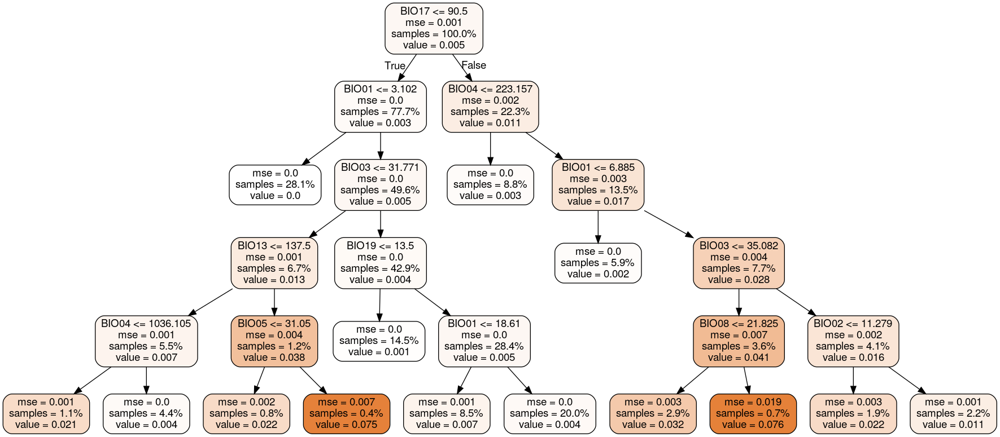

In [50]:
# Select the model
s = 'best' # 'random' # 
c = 'ccp' # 'no_ccp' # 

# Create an empty object to receive a string buffer in DOT format.
dot_data = StringIO()

# Exports the tree in DOT format into the out_file 
export_graphviz(DTR[s][c], out_file = dot_data, max_depth = md[s][c], 
                feature_names = [f[:5] for f in bv_cols],
                proportion = True, filled = True, rounded = True)

# Use the DOT object to create the graph.
tree = graph_from_dot_data(dot_data.getvalue())

if save_plot: 
    tree.write_png(os.path.join(plot_dir, f"IGBP{lc_id}_DTR_tree_{s}_{c}_md{md[s][c]}.png"))

Image(tree.create_png())

## Feature importances

Let us look at the importance that each feature assumes in the previous relevant models, taking into consideration both splitting approaches.

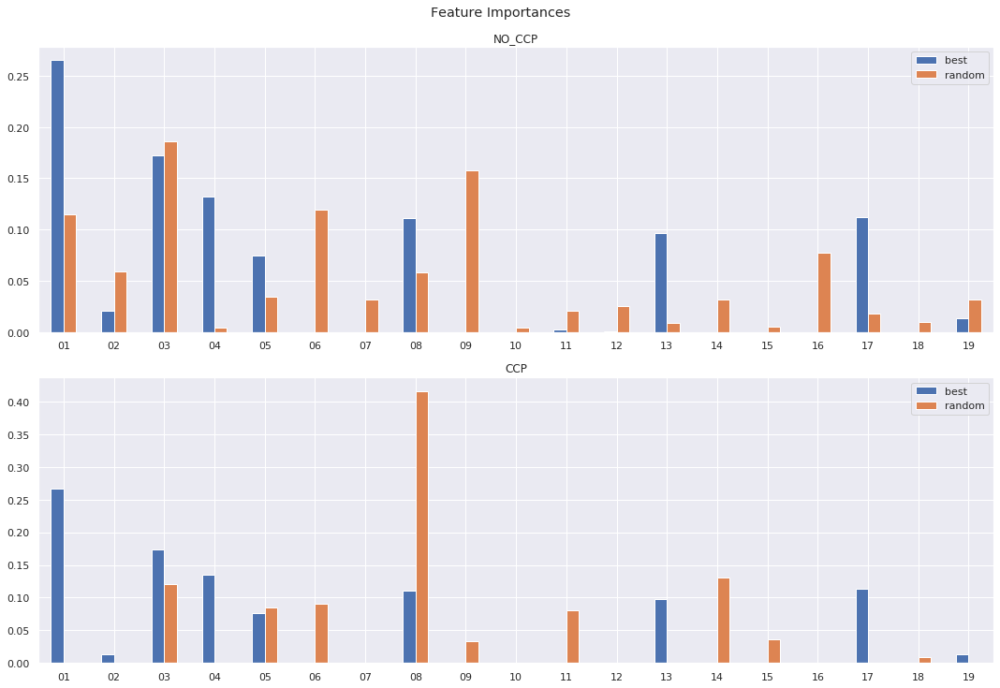

In [51]:
fig, axs = plt.subplots(nrows = 2, figsize = (15,10))

for ax, c in zip(axs, ['no_ccp', 'ccp']):
    FI = pd.DataFrame([DTR['best'][c].feature_importances_,
                       DTR['random'][c].feature_importances_],
                      columns = bv_cols, index = ['best', 'random']).T

    FI.plot(kind = 'bar', rot = 0, ax = ax)
    ax.set(xticklabels = bv_ids, title = c.upper())

fig.tight_layout()
if save_plot:
    plt.savefig(os.path.join(plot_dir,f'IGBP{lc_id}_DTR_FeatureImportances.jpg'),
                optimize = True, box_inches = 'tight', dpi = 200)

plt.suptitle('Feature Importances', y = 1.02)
plt.show()

In [52]:
print("Features sorted by importance - splitter = best with ccp\n")
for i,bv in enumerate(FI.sort_values(by='best', ascending = False).index.values):
    print(f"{i+1}. ({bv[3:5]}) {id2bv[bv[3:5]]} ")

Features sorted by importance - splitter = best with ccp

1. (01) annual mean temperature 
2. (03) isothermality 
3. (04) temperature seasonality 
4. (17) precipitations of driest quarter 
5. (08) mean temperature of wettest quarter 
6. (13) precipitations of wettest month 
7. (05) max temperature of warmest month 
8. (19) precipitations of driest quarter 
9. (02) mean diurnal range 
10. (09) mean temperature of driest quarter 
11. (11) mean temperature of coldest quarter 
12. (12) annual precipitations 
13. (07) annual temperature range 
14. (14) precipitations of driest month 
15. (15) precipitation seasonality 
16. (16) precipitations of wettest quarter 
17. (06) min temperature of coldest month 
18. (18) precipitations of driest quarter 
19. (10) mean temperature of warmest quarter 


## Geographical visualization of the residuals

Let us visualize on the planisphere the prediction residuals of a relevant model. The residuals will be computed on both the train and the test data sets.  

In [53]:
# Select the model
s = 'best' # 'random' #
c = 'ccp' # 'no_ccp' #

# Prediction on the test set
y_pred_test = DTR[s][c].predict(X_test)
# Prediction on the train set
y_pred_train = DTR[s][c].predict(X_train)

# GeoDataFrame containing the residuals and the geometry information
RES = data[['HID','geometry']].copy()
## Residuals are stored in the same column 
RES['Residual'] = pd.concat([y_test - y_pred_test, y_train - y_pred_train])
# Masks that allow to distinguish among the origin of residuals
test_ids = y_test.index
train_ids = y_train.index

### Test residuals

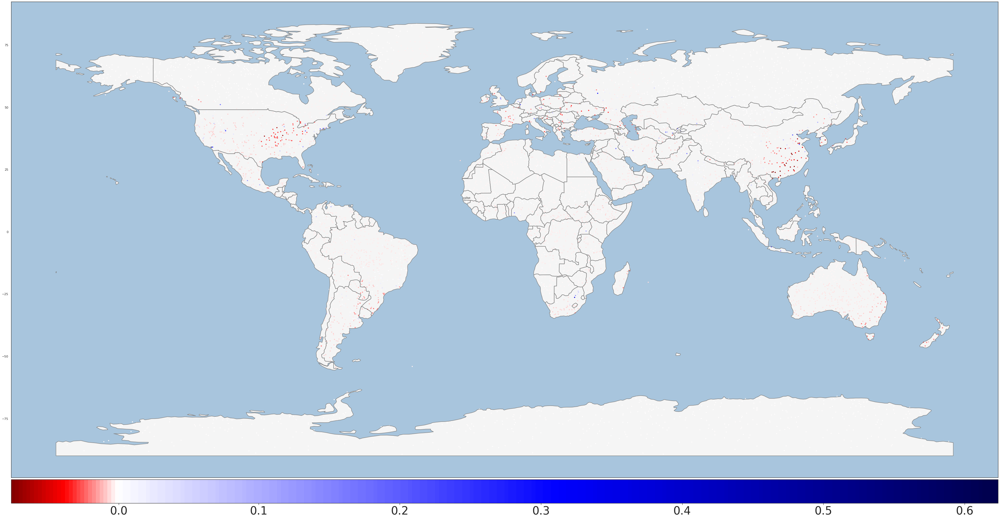

In [54]:
GeoPlot(RES.loc[test_ids], col = 'Residual', cmap = 'seismic_r', boundary_color = 'grey',
        centred = True, vmin = -1, vmax = 1, save = save_plot, plot_dir = plot_dir, 
        title = f'IGBP{lc_id}_DTR_TestResidualsMap_{s}_{c}.jpg')

### Train residuals

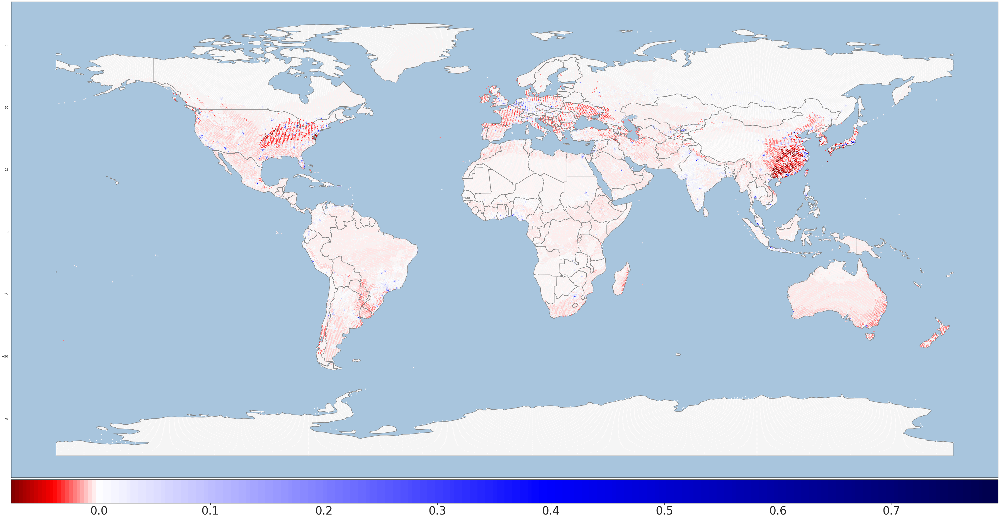

In [55]:
GeoPlot(RES.loc[train_ids], col = 'Residual', cmap = 'seismic_r', boundary_color = 'grey',
        centred = True, vmin = -1, vmax = 1, save = save_plot, plot_dir = plot_dir, 
        title = f'IGBP{lc_id}_DTR_TrainResidualsMap_{s}_{c}.jpg')

### All residuals

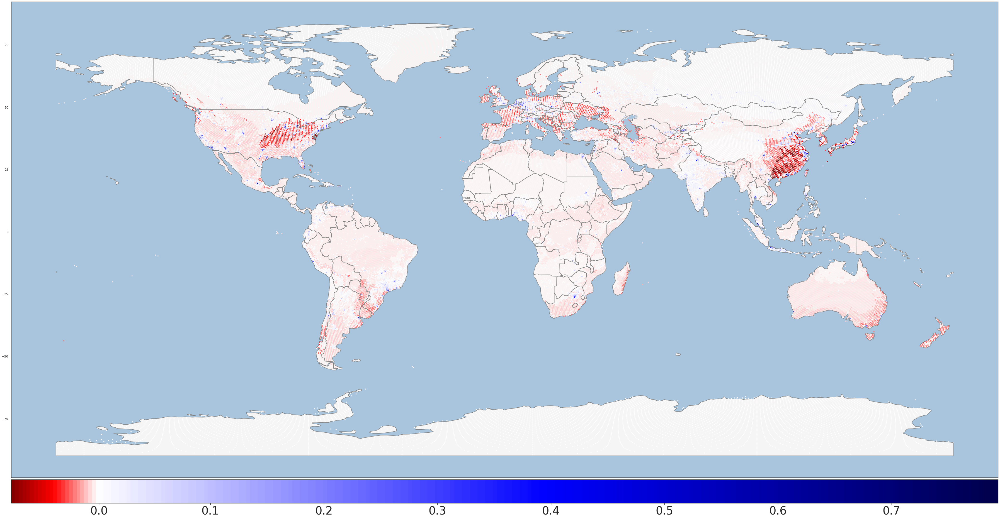

In [56]:
GeoPlot(RES, col = 'Residual', cmap = 'seismic_r', boundary_color = 'grey',
        centred = True, vmin = -1, vmax = 1, save = save_plot, plot_dir = plot_dir, 
        title = f'IGBP{lc_id}_DTR_ResidualsMap_{s}_{c}.jpg')

# Random Forests

Now, let us make use of the more sofisticated random forests for the same purpose. We will follow approximately the same outline of investigation.

## Pre-pruning 1: control the maximum depth of trees in the forest

Let us check how the MSE on the train and test set, and estimated by CV, varies as the maximum depth of the trees in the forest grows.

In [57]:
# Range of max_dept 
d_min, d_max = 7, 39

test_MSE = []
train_MSE = []

for d in list(range(d_min, d_max)):
    # Random Forest with max_depth = d
    RFR = RandomForestRegressor(n_estimators = 50,
                                max_depth = d,
                                bootstrap = True,
                                n_jobs = 4)
    RFR.fit(X_train, y_train)
    # MSE on the test data 
    y_pred = RFR.predict(X_test)
    test_MSE.append(mse(y_pred, y_test))
    # MSE on the train data 
    y_pred = RFR.predict(X_train)
    train_MSE.append(mse(y_pred, y_train))

In [58]:
# Directory to store the CV results
file_dir = os.path.join(processed_data_dir,'RFR_CV.pickle')

if os.path.exists(file_dir):
    with open(file_dir, 'rb') as file: RFR_CV = pickle.load(file)
    print('CV loaded')   
else: 
    # Grid Search and k-fold CV
    RFR_CV = GridSearchCV(estimator = RandomForestRegressor(n_estimators = 50,
                                                            bootstrap = True),
                          param_grid = {'max_depth': list(range(d_min, d_max))},
                          scoring = 'neg_mean_squared_error',
                          cv = 4,
                          return_train_score = True,
                          n_jobs = 4,
                          verbose = 3)

    RFR_CV.fit(X_train, y_train)
    
    with open(file_dir, 'wb') as file: pickle.dump(RFR_CV, file)
    print('CV executed')
    
# Grid Search results
cv_MSE = RFR_CV.cv_results_['mean_test_score']*-1

Fitting 4 folds for each of 32 candidates, totalling 128 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:  2.2min
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed: 19.8min
[Parallel(n_jobs=4)]: Done 128 out of 128 | elapsed: 21.2min finished


CV executed


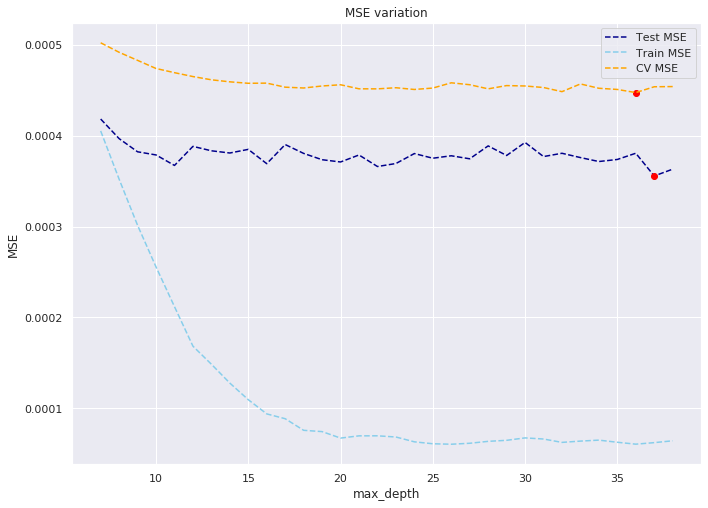

The minimum MSE on the test set is 0.000356 and it is reached at max_depth = 37.
The minimum CV MSE is 0.000447 and it is reached at max_depth = 36.


In [59]:
fig, ax = plt.subplots(figsize = (10,7))

x = list(range(d_min, d_max))
# Test MSE
ax.plot(x, test_MSE, linestyle = '--', color = 'darkblue', label = 'Test MSE', zorder = 1)
ax.scatter(min(x)+np.argmin(test_MSE), min(test_MSE), color = 'red', zorder = 2)
# Train MSE
plt.plot(x, train_MSE, linestyle = '--', color = 'skyblue', label = 'Train MSE', zorder = 1)
# CV MSE
plt.plot(x, cv_MSE, linestyle = '--', color = 'orange', label = 'CV MSE')
ax.scatter(min(x)+np.argmin(cv_MSE), min(cv_MSE), color = 'red', zorder = 2)
        
ax.set(xlabel = 'max_depth', ylabel = 'MSE')
ax.legend()
plt.tight_layout()

if save_plot: plt.savefig(os.path.join(plot_dir,f'IGBP{lc_id}_RFR_MSEvsMaxDepth.jpg'),
                          optimize = True, box_inches = 'tight', dpi = 200)
    
ax.set_title('MSE variation')
plt.show()

print(f"The minimum MSE on the test set is {np.min(test_MSE):.3} "
      f"and it is reached at max_depth = {d_min+np.argmin(test_MSE)}.\n"
      f"The minimum CV MSE is {np.min(cv_MSE):.3} "
      f"and it is reached at max_depth = {d_min+np.argmin(cv_MSE)}.")

## Search of parameters

In the following we will use the same cost-complexity tuning parameters $\alpha$ used for decision trees.

In [60]:
#Range of max_depth
d_min, d_max = 31, 40

# Hyperparameters for the Grid Search
hyperparams = {'n_estimators': [50, 100, 200], 
               'max_depth': list(range(d_min, d_max)),
               'min_samples_split': [2, 5, 10, 15],
               'ccp_alpha': ccp_alpha}

# Directory to store the Grid Search results
file_dir = os.path.join(processed_data_dir,'RFR_GS.pickle')

if os.path.exists(file_dir):
    with open(file_dir, 'rb') as file: RFR_GS = pickle.load(file)
    print('Grid Search loaded')
else:  
    # Grid Search and k-fold CV
    RFR_GS = GridSearchCV(estimator = RandomForestRegressor(criterion = 'mse',
                                                           bootstrap = True),
                          param_grid = hyperparams,
                          scoring = 'neg_mean_squared_error',
                          cv = 3,
                          return_train_score = True,
                          n_jobs = 4,
                          verbose = 3)

    RFR_GS.fit(X_train, y_train)
    
    with open(file_dir, 'wb') as file: pickle.dump(RFR_GS, file)
    print('Grid Search executed')

# Grid Search results
RFR_GS_results = pd.DataFrame(RFR_GS.cv_results_)

Fitting 3 folds for each of 324 candidates, totalling 972 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
/home/dario/anaconda3/lib/python3.7/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed: 11.7min
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed: 61.7min
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed: 143.5min
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed: 280.8min
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed: 463.9min
[Parallel(n_jobs=4)]: Done 972 out of 972 | elapsed: 576.4min finished


Grid Search executed


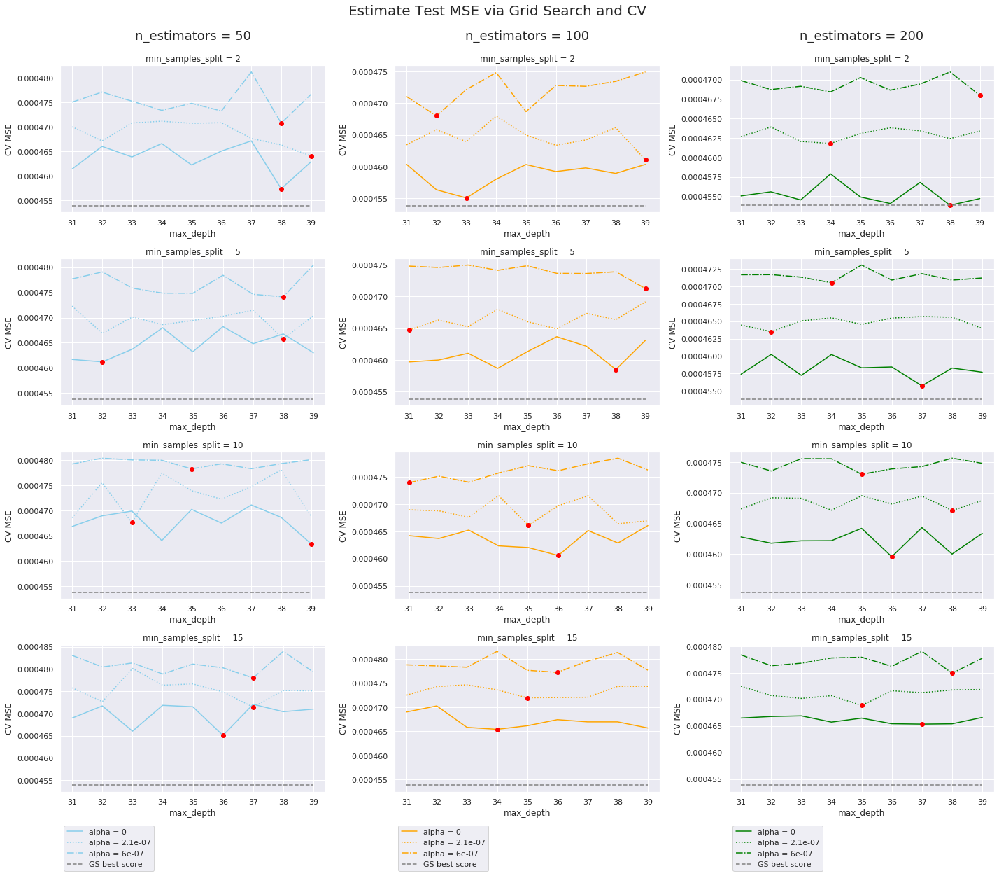

In [61]:
fig, ax = plt.subplots(nrows = 4, ncols = 3, figsize = (20,17))

ls = ['-', ':', '-.']
col = ['skyblue', 'orange', 'green']

R = RFR_GS_results
for j, n in enumerate(hyperparams['n_estimators']):
    for i,mss in enumerate(hyperparams['min_samples_split']):
        for k, alpha in enumerate(hyperparams['ccp_alpha']):
            MSE = R[(R.param_min_samples_split == mss) & (R.param_n_estimators == n) &
                    (R.param_ccp_alpha == alpha)].mean_test_score.values*-1
            
            ax[i,j].plot(list(range(d_min, d_max)), MSE, linestyle = ls[k],
                         color = col[j], label = f'alpha = {alpha}', zorder = 1)
            ax[i,j].scatter(d_min+np.argmin(MSE), min(MSE), color = 'red', zorder = 2)
    
        ax[i,j].hlines(RFR_GS.best_score_*-1, xmin = d_min, xmax = d_max-1,
                       color = 'gray', linestyles = 'dashed', label = 'GS best score')
        
        ax[i,j].set(xticks = list(range(d_min, d_max)), title = f'min_samples_split = {mss}',
                    xlabel = 'max_depth', ylabel = 'CV MSE')

    ax[0,j].text(x = 0.5, y = 1.2, s=f"n_estimators = {n}", size = 18, 
                 horizontalalignment='center', verticalalignment='center',
                 transform=ax[0,j].transAxes)
    ax[i,j].legend(bbox_to_anchor = (0,-0.2), loc = "upper left")

fig.tight_layout()

if save_plot: plt.savefig(os.path.join(plot_dir,f'IGBP{lc_id}_RFR_GS_results.jpg'),
                          optimize = True, box_inches = 'tight', dpi = 200)

fig.suptitle('Estimate Test MSE via Grid Search and CV ', y = 1.02, size = 20)
plt.show()

It seems that increasing the number of estimators improves the regresison performances in terms of MSE. On the other hand, simultaneously with the number of estimators, the computational complexity of the model grows, so that it is questionable whether this increase of precision is worth the work. In order to further investigate that, we perform a second grid search over the same range of `max_depth`, trying other amounts of estimators. We do not apply cost-complexity pruning since it does not seem to be effective on random forests. 

In [62]:
# Hyperparameters for the Grid Search
hyperparams = {'n_estimators': [20, 40, 60, 80, 150], 
               'max_depth': list(range(d_min, d_max)),
               'min_samples_split': [2, 5]}

# Directory to store the Grid Search results
file_dir = os.path.join(processed_data_dir,'RFR_GS_NumEst.pickle')

if os.path.exists(file_dir):
    with open(file_dir, 'rb') as file: RFR_GS2 = pickle.load(file)
    print('Grid Search loaded')
else:  
    # Grid Search and k-fold CV
    RFR_GS2 = GridSearchCV(estimator = RandomForestRegressor(criterion ='mse',
                                                             bootstrap = True),
                           param_grid = hyperparams,
                           scoring = 'neg_mean_squared_error',
                           cv = 3,
                           return_train_score = True,
                           n_jobs = 4,
                           verbose = 3)

    RFR_GS2.fit(X_train, y_train)
    
    with open(file_dir, 'wb') as file: pickle.dump(RFR_GS2, file)
    print('Grid Search executed')

# Grid Search results      
RFR_GS2_results = pd.DataFrame(RFR_GS2.cv_results_)        

Fitting 3 folds for each of 90 candidates, totalling 270 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:  6.7min
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed: 37.4min
[Parallel(n_jobs=4)]: Done 270 out of 270 | elapsed: 73.9min finished


Grid Search executed


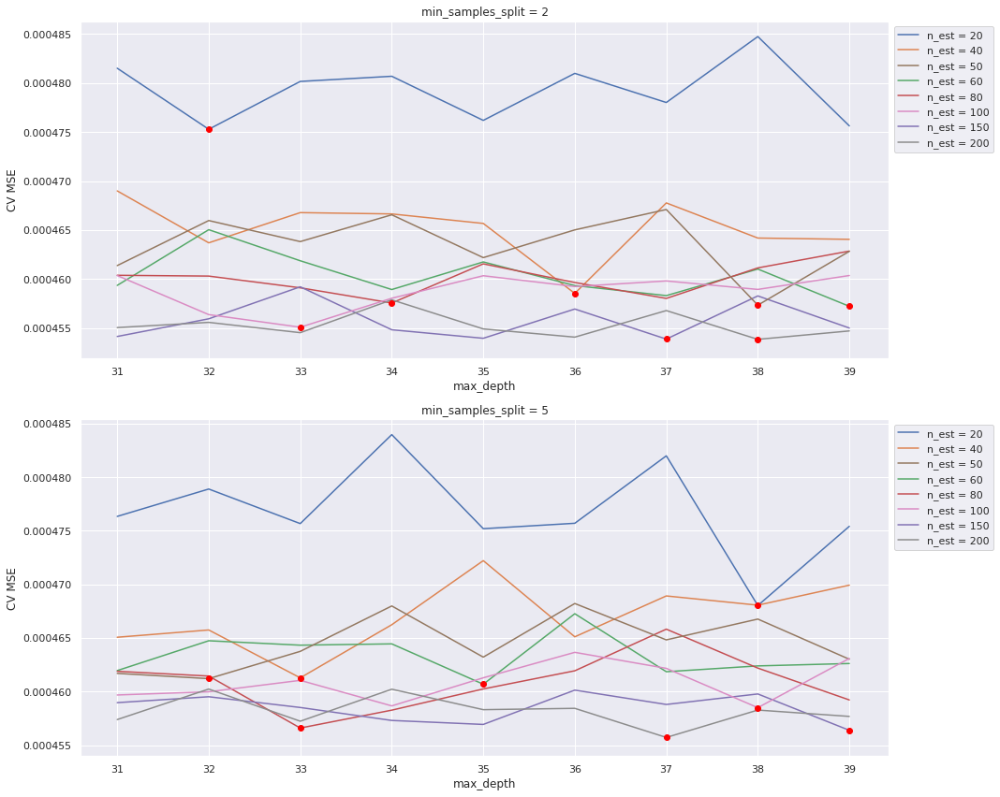

In [63]:
fig, ax = plt.subplots(nrows = 2, figsize = (15,12))

R1 = RFR_GS2_results
R2 = RFR_GS_results
for i, mss in enumerate(hyperparams['min_samples_split']):
    for n in hyperparams['n_estimators']:
        MSE = R1[(R1.param_min_samples_split == mss) &
                 (R1.param_n_estimators == n)].mean_test_score.values*-1
        
        ax[i].plot(list(range(d_min, d_max)), MSE, label = f'n_est = {n}', zorder = 1)
        ax[i].scatter(d_min+np.argmin(MSE), min(MSE), color = 'red', zorder = 2)
        
    for n in [50, 100, 200]:
        MSE = R2[(R2.param_min_samples_split == mss) & (R2.param_n_estimators == n) &
                 (R2.param_ccp_alpha == 0)].mean_test_score.values*-1
        
        ax[i].plot(list(range(d_min, d_max)), MSE, label = f'n_est = {n}', zorder = 1)
        ax[i].scatter(d_min+np.argmin(MSE), min(MSE), color = 'red', zorder = 2)
        
    ax[i].set(xticks = list(range(d_min, d_max)), title = f'min_samples_split = {mss}',
              xlabel = 'max_depth', ylabel = 'CV MSE')
    
    handles, labels = ax[i].get_legend_handles_labels()
    handles, labels = zip(*sorted(zip(handles, labels), key = lambda t: int(t[1][8:])))
    ax[i].legend(handles, labels, bbox_to_anchor=(1,1), loc = "upper left")

fig.tight_layout()

if save_plot: plt.savefig(os.path.join(plot_dir,f'IGBP{lc_id}_RFR_GS_NumEst.jpg'),
                          optimize = True, box_inches = 'tight', dpi = 200)

plt.show()

### Some relevant models

As for regression trees, let us analyse more carefully some regressors:
 - The best performing random forest with `n_estimators = 50`, both with *ccp* and without it;
 - The best performing random forest with `n_estimators = 100`, both with *ccp* and without it;
 - The best performing random forest with `n_estimators = 200`, both with *ccp* and without it;
   
Let us look at their predictive performance in terms of MSE

In [64]:
# Useful tools for the next cell
n_estimators = ['50','100','200']
ccp = [('ccp', '>'), ('no_ccp','==')]
cols = ['n_estimators', 'max_depth', 'min_samples_split', 'ccp_alpha',
        'CV_MSE', 'Prediction_MSE', 'Best_Performance']

# Dict od dicts that will contain the relevant models
RFR = {'50': {}, '100': {}, '200':{}}

In [65]:
# DataFrame that will contain parameters and results of Relevant Models 
RM = pd.DataFrame(columns = cols) 

for n in n_estimators:
    for c,sym in ccp:
        # Find relevant model's parameters 
        mask = eval(f"(RFR_GS_results.param_n_estimators == {n}) & (RFR_GS_results.param_ccp_alpha {sym} 0)")
        D = RFR_GS_results[mask]
        D = D[(D.mean_test_score == D.mean_test_score.max())]
        
        # Relevant model
        rgr = RandomForestRegressor(n_estimators = D.param_n_estimators.item(),
                                    max_depth = D.param_max_depth.item(),
                                    min_samples_split = D.param_min_samples_split.item(),
                                    ccp_alpha = D.param_ccp_alpha.item())
        rgr.fit(X_train, y_train)
        
        # Prediction
        y_pred = rgr.predict(X_test)
        MSE = mse(y_test, y_pred)
        
        # Store results
        df = pd.DataFrame([rgr.n_estimators, rgr.max_depth, rgr.min_samples_split,
                           rgr.ccp_alpha, -D.mean_test_score.item(), MSE],
                          index = cols[:-1]).T
        RM = pd.concat([RM, df], ignore_index = True)
        # Store relevant model
        RFR[n][c] = rgr     

# Identify best model in the CV
mask = eval(' & '.join([f'(RM.{p} == RFR_GS.best_estimator_.{p})' for p in cols[:4]])) 
RM.at[RM[mask].index, 'Best_Performance'] = 'CV'
# Identify best model on the test set
for i in RM[RM.Prediction_MSE == RM.Prediction_MSE.min()].index.values:
    if i in RM[mask].index.values:
        RM.at[i, 'Best_Performance'] = 'CV, Test'
    else: 
        RM.at[i, 'Best_Performance'] = 'Test'

RM

,n_estimators,max_depth,min_samples_split,ccp_alpha,CV_MSE,Prediction_MSE,Best_Performance
0,50.0,39.0,2.0,2.100000e-07,0.000464,0.000380,NaN
1,50.0,38.0,2.0,0.000000e+00,0.000457,0.000379,NaN
2,100.0,39.0,2.0,2.100000e-07,0.000461,0.000385,NaN
3,100.0,33.0,2.0,0.000000e+00,0.000455,0.000365,Test
4,200.0,34.0,2.0,2.100000e-07,0.000462,0.000372,NaN
5,200.0,38.0,2.0,0.000000e+00,0.000454,0.000378,CV


## Feature importances

Let us look at the importance that each feature assumes in the previous relevant models, and looking if relevant differences are present as the number of estimators increases.

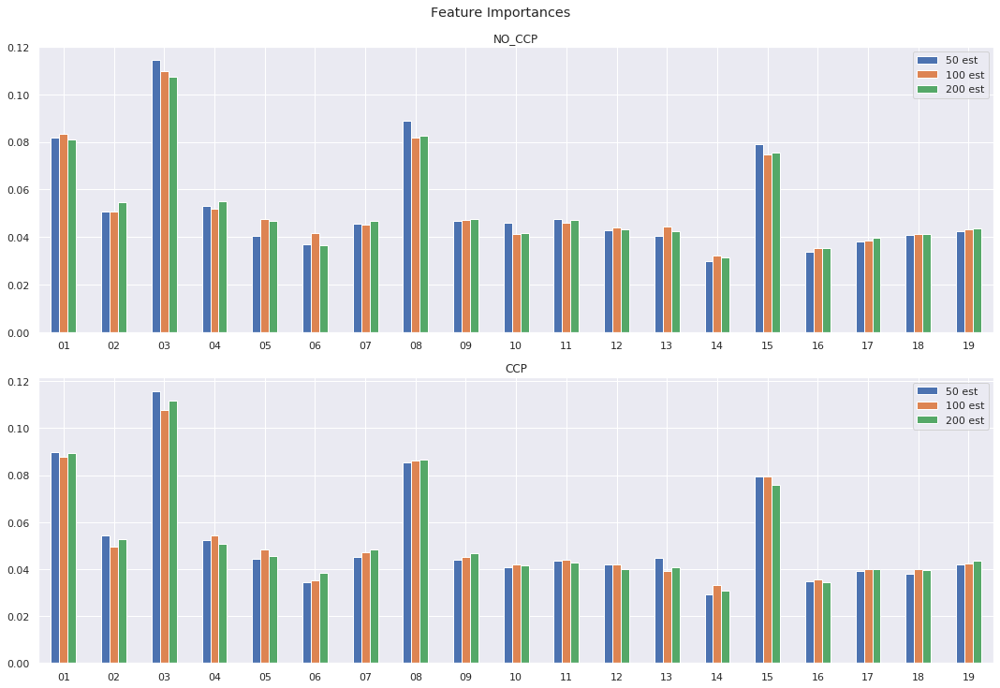

In [66]:
fig, axs = plt.subplots(nrows = 2, figsize = (15,10))

for ax, c in zip(axs, ['no_ccp', 'ccp']):
    FI = pd.DataFrame([RFR['50'][c].feature_importances_,
                       RFR['100'][c].feature_importances_,
                       RFR['200'][c].feature_importances_],
                      columns = bv_cols, index = ['50 est','100 est', '200 est']).T

    FI.plot(kind = 'bar', rot = 0, ax = ax)
    ax.set(xticklabels = bv_ids, title = c.upper())

fig.tight_layout()
if save_plot:
    plt.savefig(os.path.join(plot_dir,f'IGBP{lc_id}_RFR_FeatureImportances.jpg'),
                optimize = True, box_inches = 'tight', dpi = 200)

plt.suptitle('Feature Importances', y = 1.02)
plt.show()

In [67]:
print("Features sorted by importance - estimators = 100 with ccp\n")
for i, bv in enumerate(FI.sort_values(by='100 est', ascending = False).index.values):
    print(f"{i+1}. ({bv[3:5]}) {id2bv[bv[3:5]]} ")

Features sorted by importance - estimators = 100 with ccp

1. (03) isothermality 
2. (01) annual mean temperature 
3. (08) mean temperature of wettest quarter 
4. (15) precipitation seasonality 
5. (04) temperature seasonality 
6. (02) mean diurnal range 
7. (05) max temperature of warmest month 
8. (07) annual temperature range 
9. (09) mean temperature of driest quarter 
10. (11) mean temperature of coldest quarter 
11. (19) precipitations of driest quarter 
12. (12) annual precipitations 
13. (10) mean temperature of warmest quarter 
14. (17) precipitations of driest quarter 
15. (18) precipitations of driest quarter 
16. (13) precipitations of wettest month 
17. (16) precipitations of wettest quarter 
18. (06) min temperature of coldest month 
19. (14) precipitations of driest month 


## Geographical visualization of the residuals  

Let us visualize on the planisphere the residuals of a relevant model. The residuals will be computed on both the train and the test data sets.  

In [68]:
# Select the model
n = '100' # '50' # '200'
c = 'ccp' # 'no_ccp' #

# Prediction on the test set
y_pred_test = RFR[n][c].predict(X_test)
# Prediction on the train set
y_pred_train = RFR[n][c].predict(X_train)

# GeoDataFrame containing the residuals and the geometry information
RES = data[['HID','geometry']].copy()
## Residuals are stored in the same column 
RES['Residual'] = pd.concat([y_test - y_pred_test, y_train - y_pred_train])
# Masks that allow to distinguish among the origin of residuals
test_ids = y_test.index
train_ids = y_train.index

### Test residuals

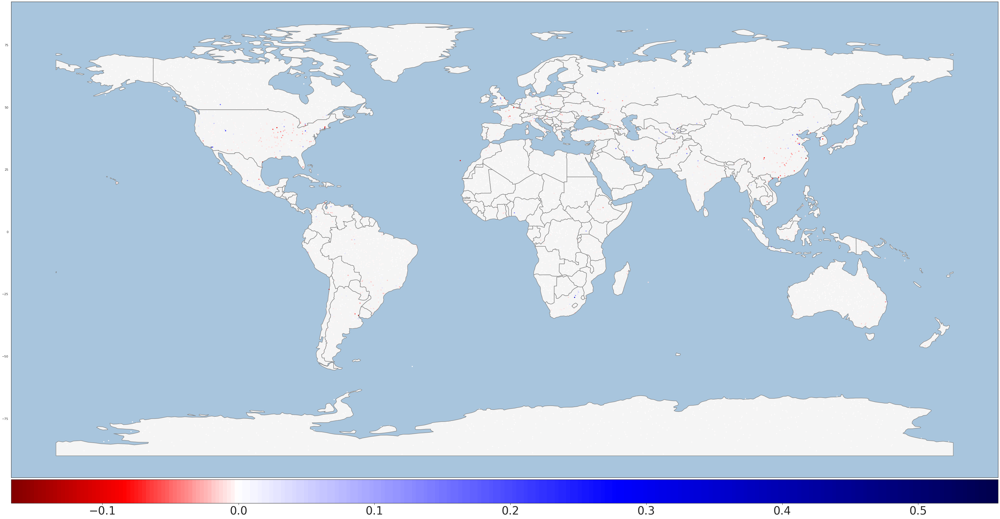

In [69]:
GeoPlot(RES.loc[test_ids], col = 'Residual', cmap = 'seismic_r', boundary_color = 'grey',
        centred = True, vmin = -1, vmax = 1, save = save_plot, plot_dir = plot_dir, 
        title = f'IGBP{lc_id}_RFR_TestResidualsMap_{n}_{c}.jpg')

### Train residuals

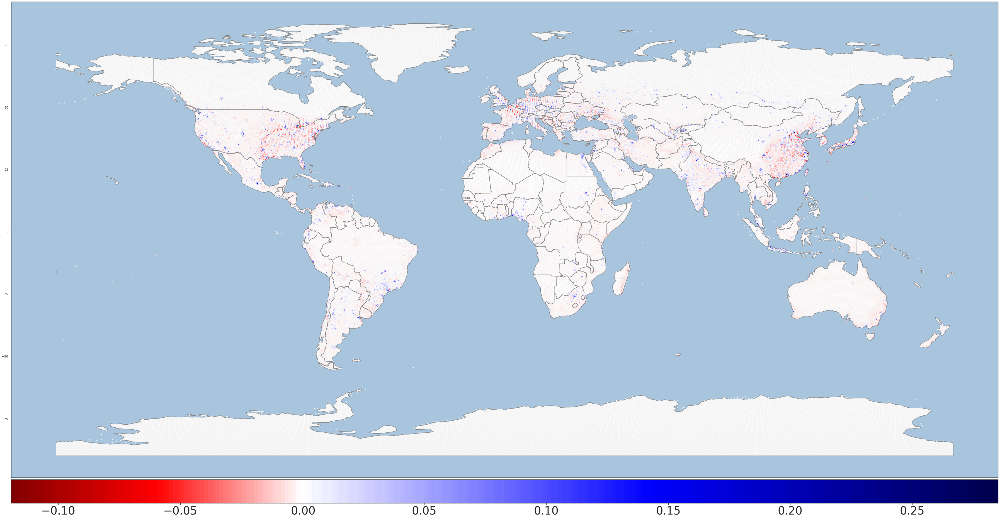

In [70]:
GeoPlot(RES.loc[train_ids], col = 'Residual', cmap = 'seismic_r', boundary_color = 'grey',
        centred = True, vmin = -1, vmax = 1, save = save_plot, plot_dir = plot_dir, 
        title = f'IGBP{lc_id}_RFR_TrainResidualsMap_{n}_{c}.jpg')

### All residuals

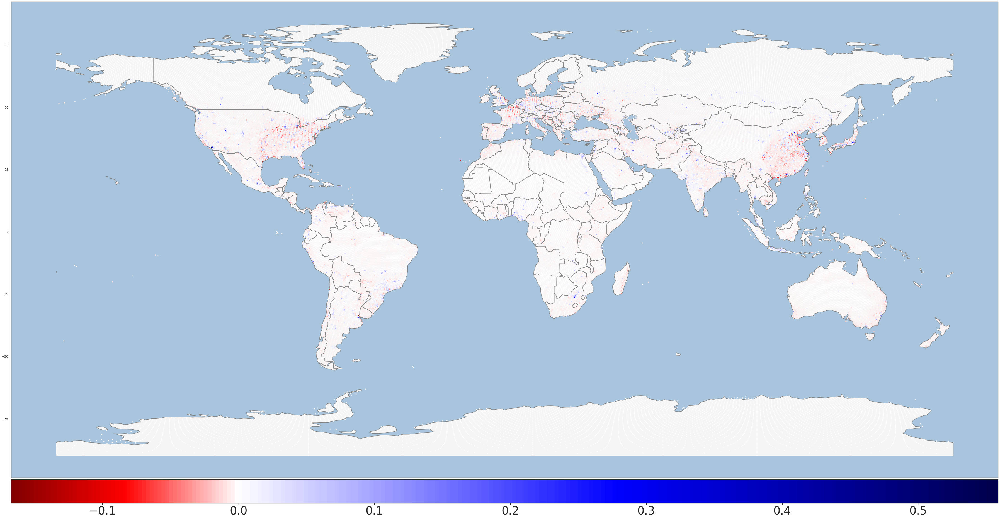

In [71]:
GeoPlot(RES, col = 'Residual', cmap = 'seismic_r', boundary_color = 'grey',
        centred = True, vmin = -1, vmax = 1,        save = save_plot, plot_dir = plot_dir, 
        title = f'IGBP{lc_id}_RFR_ResidualsMap_{n}_{c}.jpg')